In [50]:
import sys
import os
import scipy.io as sio
import pandas as pd
import numpy as np
sys.path.append("lib")
import dbutils as db

In [51]:
df = pd.read_csv('matches_PL_2023.csv')
match_ids = df['match_id'].tolist()

match_ids = match_ids[: 10]
match_ids

[5354538,
 5354533,
 5354720,
 5354713,
 5354712,
 5354714,
 5354716,
 5354717,
 5354721,
 5354719]

In [52]:
params = {
    "competition_id": 364,
    "season_id": None,
    "match_id": match_ids
}

In [115]:
#データの読み込み
sql="sql/get_dataset.sql"
events=db.execute_query_select(sql,params)
events=pd.DataFrame(events)
events = events.sort_values(by=['match_id', 'vide_timestamp'], ascending=[True, True])
events = events.drop(columns=['match_period'])
events = events.reset_index(drop=True)
events

,id,match_id,minute,second,vide_timestamp,type,location,team_id,opponent_team_id,player_id,shot,pass,ground_duel,aerial_duel,infraction,side
0,1559860911,5354533,0,2,3.938862,"{""primary"": ""pass"", ""secondary"": [""back_pass"", ""short_or_medium_pass""]}","{""x"": 50, ""y"": 52}",1623,1609,28292,null,"{""accurate"": true, ""angle"": 166, ""height"": null, ""length"": 16, ""recipient"": {""id"": 9433, ""name"": ""J. Tarkowski"", ""position"": ""LCB""}, ""endLocation"": {""x"": 35, ""y"": 57}}",null,null,null,away
1,1559860908,5354533,0,5,6.248117,"{""primary"": ""pass"", ""secondary"": [""forward_pass"", ""long_pass"", ""pass_to_final_third"", ""progressive_pass""]}","{""x"": 35, ""y"": 57}",1623,1609,9433,null,"{""accurate"": true, ""angle"": 24, ""height"": ""high"", ""length"": 45, ""recipient"": {""id"": 540754, ""name"": ""A. Onana"", ""position"": ""RCMF3""}, ""endLocation"": {""x"": 74, ""y"": 84}}",null,null,null,away
2,1559860091,5354533,0,8,9.424938,"{""primary"": ""duel"", ""secondary"": [""aerial_duel"", ""loss"", ""recovery""]}","{""x"": 26, ""y"": 16}",1609,1623,415917,null,null,null,"{""opponent"": {""id"": 540754, ""name"": ""A. Onana"", ""position"": ""RCMF3"", ""height"": 192}, ""firstTouch"": true, ""height"": 190, ""relatedDuelId"": 1559860925}",null,home
3,1559860925,5354533,0,8,9.424938,"{""primary"": ""duel"", ""secondary"": [""aerial_duel"", ""loss""]}","{""x"": 74, ""y"": 84}",1623,1609,540754,null,null,null,"{""opponent"": {""id"": 415917, ""name"": ""Gabriel Magalhaes"", ""position"": ""LCB"", ""height"": 190}, ""firstTouch"": false, ""height"": 192, ""relatedDuelId"": 1559860091}",null,away
4,1559860926,5354533,0,10,11.430891,"{""primary"": ""pass"", ""secondary"": [""forward_pass"", ""long_pass"", ""loss"", ""pass_to_final_third""]}","{""x"": 61, ""y"": 97}",1623,1609,8240,null,"{""accurate"": false, ""angle"": -29, ""height"": ""high"", ""length"": 21, ""recipient"": {""id"": 415917, ""name"": ""Gabriel Magalhaes"", ""position"": ""LCB""}, ""endLocation"": {""x"": 78, ""y"": 82}}",null,null,null,away
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17236,1558754780,5354721,96,54,5904.543888,"{""primary"": ""pass"", ""secondary"": [""forward_pass"", ""loss"", ""pass_to_penalty_area"", ""short_or_medium_pass"", ""smart_pass"", ""through_pass""]}","{""x"": 75, ""y"": 47}",1642,1633,25572,null,"{""accurate"": false, ""angle"": -24, ""height"": null, ""length"": 13, ""recipient"": {""id"": 447963, ""name"": ""B. Johnson"", ""position"": ""LB""}, ""endLocation"": {""x"": 86, ""y"": 39}}",null,null,null,away
17237,1558754824,5354721,96,55,5905.735688,"{""primary"": ""interception"", ""secondary"": [""long_pass"", ""loss"", ""pass"", ""progressive_pass""]}","{""x"": 14, ""y"": 61}",1633,1642,447963,null,"{""accurate"": false, ""angle"": -59, ""height"": ""high"", ""length"": 6, ""recipient"": {""id"": 7934, ""name"": ""J. Lingard"", ""position"": ""LAMF""}, ""endLocation"": {""x"": 17, ""y"": 53}}",null,null,null,home
17238,1558754781,5354721,96,56,5906.026305,"{""primary"": ""interception"", ""secondary"": [""loss"", ""recovery"", ""counterpressing_recovery""]}","{""x"": 83, ""y"": 47}",1642,1633,7934,null,null,null,null,null,away
17239,1558754825,5354721,96,57,5907.57534,"{""primary"": ""clearance"", ""secondary"": [""loss""]}","{""x"": 14, ""y"": 56}",1633,1642,375011,null,null,null,null,null,home


In [116]:
# 文字列を辞書に変換
import json

events['location'] = events['location'].apply(json.loads)
events['type'] = events['type'].apply(json.loads)
events['shot'] = events['shot'].apply(json.loads)
events['pass'] = events['pass'].apply(json.loads)
events['ground_duel'] = events['ground_duel'].apply(json.loads)
events['aerial_duel'] = events['aerial_duel'].apply(json.loads)

In [117]:
# アクションの取得
events['primary_action'] = events['type'].apply(lambda x: x['primary'])
events['secondary_action'] = events['type'].apply(lambda x: x['secondary'])
events["secondary_action"] = events["secondary_action"].apply(lambda x: x[0] if x else None)

events = events[events['primary_action'] != 'game_interruption']
events = events[events['primary_action'] != 'fairplay']

def get_action(row):
    if row["primary_action"] == 'shot' or row["primary_action"] == 'pass' or row["primary_action"] == 'infraction' or row["primary_action"] == 'corner' or row["primary_action"] == 'shot_against' or row["primary_action"] == 'goal_kick':
        return row["primary_action"]
    elif row["secondary_action"] is not None:
        return row["secondary_action"]
    else:
        return row["primary_action"]
    
events["action"] = events.apply(get_action, axis=1)

events.loc[events['secondary_action'] == 'third_assist', 'action'] = events.loc[events['secondary_action'] == 'third_assist', 'primary_action']
events.loc[events['secondary_action'] == 'second_assist', 'action'] = events.loc[events['secondary_action'] == 'second_assist', 'primary_action']
events.loc[events['secondary_action'] == 'assist', 'action'] = events.loc[events['secondary_action'] == 'assist', 'primary_action']
events.loc[events['secondary_action'] == 'under_pressure', 'action'] = events.loc[events['secondary_action'] == 'under_pressure', 'primary_action']
events.loc[events['secondary_action'] == 'short_or_medium_pass', 'action'] = 'pass'
events.loc[events['secondary_action'] == 'linkup_play', 'action'] = 'pass'
events.loc[events['secondary_action'] == 'forward_pass', 'action'] = 'pass'
events.loc[events['secondary_action'] == 'lateral_pass', 'action'] = 'pass'
events.loc[events['secondary_action'] == 'deep_completion', 'action'] = 'pass'
events.loc[events['secondary_action'] == 'long_pass', 'action'] = 'pass'
events.loc[events['secondary_action'] == 'hand_pass', 'action'] = 'pass'
events.loc[events['secondary_action'] == 'head_pass', 'action'] = 'pass'
events.loc[events['secondary_action'] == 'back_pass', 'action'] = 'pass'
events.loc[events['action'] == 'free_kick', 'action'] = 'free_kick_pass'
events.loc[events['secondary_action'] == 'opportunity', 'action'] = 'shot'
events.loc[events['secondary_action'] == 'foul_suffered', 'action'] = 'offensive_duel'
events.loc[events['secondary_action'] == 'ground_duel', 'action'] = 'offensive_duel'
events.loc[events['secondary_action'] == 'goal', 'action'] = events.loc[events['secondary_action'] == 'goal', 'primary_action']
events.loc[events['secondary_action'] == 'loss', 'action'] = events.loc[events['secondary_action'] == 'loss', 'primary_action']
events.loc[events['secondary_action'] == 'recovery', 'action'] = events.loc[events['secondary_action'] == 'recovery', 'primary_action']
events.loc[events['secondary_action'] == 'touch_in_box', 'action'] = events.loc[events['secondary_action'] == 'touch_in_box', 'primary_action']

events = events.drop(columns=['type'])


In [118]:
unique_actions = events['action'].unique().tolist()

print(len(unique_actions))
unique_actions

25


['pass',
 'aerial_duel',
 'carry',
 'offensive_duel',
 'defensive_duel',
 'infraction',
 'free_kick_pass',
 'throw_in',
 'touch',
 'interception',
 'offside',
 'dribble',
 'progressive_run',
 'corner',
 'shot',
 'goal_kick',
 'loose_ball_duel',
 'clearance',
 'shot_against',
 'acceleration',
 'shot_block',
 'free_kick_cross',
 'goalkeeper_exit',
 'free_kick_shot',
 'penalty']

In [119]:
#Outcomeの取得

events['Pass_Outcome'] = events['pass'].apply(lambda x: 1 if x and x.get('accurate') else 0)
events['Ground_duel_Outcome'] = events['ground_duel'].apply(
    lambda x: 1 if x and (x.get('keptPossession') or x.get('progressedWithBall') or x.get('recoveredPossession')) else 0
)
events['Aerial_duel_Outcome'] = events['aerial_duel'].apply(lambda x: 1 if x and x.get('firstTouch') else 0)
events['Shot_Outcome'] = events['shot'].apply(lambda x: 1 if x and x.get('isGoal') else 0)

events = events[
    ~(
        (
            ((events['ground_duel'].isnull()) & events['aerial_duel'].notnull()) |
            (events['ground_duel'].notnull() & events['aerial_duel'].isnull())
        ) &
        (events['Ground_duel_Outcome'] == 0) & 
        (events['Aerial_duel_Outcome'] == 0)
    )
]

#events = events.drop(columns=['pass'])
events = events.drop(columns=['ground_duel'])
events = events.drop(columns=['aerial_duel'])

def update_outcome(row):
    if row['secondary_action'] == 'loss':
        return 0
    else:
        if row['action'] == 'carry':
            return 1
        elif row['action'] == 'interception':
            return 1
        elif row['action'] == 'progressive_run':
            return 1
        elif row['action'] == 'clearance':
            return 1
        elif row['action'] == 'acceleration':
            return 1
        elif row['action'] == 'shot_block':
            return 1
        elif row['action'] == 'goalkeeper_exit':
            return 1
        elif row['action'] == 'offside':
            return 0
        elif row['action'] == 'infraction':
            return 0
        elif row['action'] == 'touch':
            return 0
        elif row['action'] == 'loose_ball_duel':
            return 0
        elif row['action'] == 'shot':
            return 0
        elif row['action'] == 'shot_against':
            if row['secondary_action'] == 'save':
                return 1
            elif row['secondary_action'] == 'conceded_goal':
                return 0

events['outcome'] = events.apply(update_outcome, axis=1)

events['outcome'] = ((events['Pass_Outcome'] == 1) | 
                     (events['Ground_duel_Outcome'] == 1) | 
                     (events['Aerial_duel_Outcome'] == 1)).astype(int)

#ゴールの判定
events['goal'] = events['shot'].apply(lambda x: 1 if x and x.get('isGoal') else 0)
events = events.drop(columns=['shot'])
events = events.drop(columns=['primary_action'])
events = events.drop(columns=['secondary_action'])
events = events.drop(columns=['Pass_Outcome'])
events = events.drop(columns=['Ground_duel_Outcome'])
events = events.drop(columns=['Aerial_duel_Outcome'])
events = events.drop(columns=['Shot_Outcome'])

save_drop = events[events['goal'] == 1].index + 1
events.drop(save_drop, inplace=True)

events = events.reset_index(drop=True)

In [120]:
#time_remaining, durationの取得
events["time"] = events["minute"] * 60 + events["second"]
events['duration'] = events['vide_timestamp'].diff()
events['duration'].iloc[0] = 0
events['duration'] = events['duration'].apply(lambda x: 0 if x < 0 else x)

events.drop(columns=['minute', 'second', 'vide_timestamp'], inplace=True)

#time_remainingの正規化
grouped = events.groupby('match_id')

normalized_dfs = []
for _, group in grouped:
    min_time = group['time'].min()
    max_time = group['time'].max()
    time_range = max_time - min_time
    group['time'] = group['time'].apply(lambda x: (x - min_time) / time_range if time_range > 0 else 0)
    normalized_dfs.append(group)

events = pd.concat(normalized_dfs)
events.reset_index(drop=True, inplace=True)

events.reset_index(drop=True, inplace=True)
events

/var/folders/s3/5btmtsk10p325dsj9f5myq1r0000gq/T/ipykernel_30329/2839083030.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  events['duration'].iloc[0] = 0


,id,match_id,location,team_id,opponent_team_id,player_id,pass,infraction,side,action,outcome,goal,time,duration
0,1559860911,5354533,"{'x': 50, 'y': 52}",1623,1609,28292,"{'accurate': True, 'angle': 166, 'height': None, 'length': 16, 'recipient': {'id': 9433, 'name': 'J. Tarkowski', 'position': 'LCB'}, 'endLocation': {'x': 35, 'y': 57}}",null,away,pass,1,0,0.000000,0
1,1559860908,5354533,"{'x': 35, 'y': 57}",1623,1609,9433,"{'accurate': True, 'angle': 24, 'height': 'high', 'length': 45, 'recipient': {'id': 540754, 'name': 'A. Onana', 'position': 'RCMF3'}, 'endLocation': {'x': 74, 'y': 84}}",null,away,pass,1,0,0.000544,2.309255
2,1559860091,5354533,"{'x': 26, 'y': 16}",1609,1623,415917,None,null,home,aerial_duel,1,0,0.001088,3.176821
3,1559860926,5354533,"{'x': 61, 'y': 97}",1623,1609,8240,"{'accurate': False, 'angle': -29, 'height': 'high', 'length': 21, 'recipient': {'id': 415917, 'name': 'Gabriel Magalhaes', 'position': 'LCB'}, 'endLocation': {'x': 78, 'y': 82}}",null,away,pass,0,0,0.001450,2.005953
4,1559860092,5354533,"{'x': 22, 'y': 18}",1609,1623,415917,"{'accurate': False, 'angle': -152, 'height': 'high', 'length': 26, 'recipient': {'id': 0, 'name': None, 'position': None}, 'endLocation': {'x': 0, 'y': 0}}",null,home,pass,0,0,0.001813,1.896674
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14673,1558754780,5354721,"{'x': 75, 'y': 47}",1642,1633,25572,"{'accurate': False, 'angle': -24, 'height': None, 'length': 13, 'recipient': {'id': 447963, 'name': 'B. Johnson', 'position': 'LB'}, 'endLocation': {'x': 86, 'y': 39}}",null,away,pass,0,0,0.998797,1.815631
14674,1558754824,5354721,"{'x': 14, 'y': 61}",1633,1642,447963,"{'accurate': False, 'angle': -59, 'height': 'high', 'length': 6, 'recipient': {'id': 7934, 'name': 'J. Lingard', 'position': 'LAMF'}, 'endLocation': {'x': 17, 'y': 53}}",null,home,pass,0,0,0.998969,1.191800
14675,1558754781,5354721,"{'x': 83, 'y': 47}",1642,1633,7934,None,null,away,interception,0,0,0.999141,0.290617
14676,1558754825,5354721,"{'x': 14, 'y': 56}",1633,1642,375011,None,null,home,clearance,0,0,0.999312,1.549035


In [121]:
events.loc[events['action'] == 'aerial_duel', 'duration'] = 0
events.loc[events['action'] == 'ground_duel', 'duration'] = 0
events.loc[events['action'] == 'defensive_duel', 'duration'] = 0
events.loc[events['action'] == 'loose_ball_duel', 'duration'] = 0
events.loc[events['action'] == 'dribble', 'duration'] = 0

events[3:6]

,id,match_id,location,team_id,opponent_team_id,player_id,pass,infraction,side,action,outcome,goal,time,duration
3,1559860926,5354533,"{'x': 61, 'y': 97}",1623,1609,8240,"{'accurate': False, 'angle': -29, 'height': 'high', 'length': 21, 'recipient': {'id': 415917, 'name': 'Gabriel Magalhaes', 'position': 'LCB'}, 'endLocation': {'x': 78, 'y': 82}}",null,away,pass,0,0,0.001450,2.005953
4,1559860092,5354533,"{'x': 22, 'y': 18}",1609,1623,415917,"{'accurate': False, 'angle': -152, 'height': 'high', 'length': 26, 'recipient': {'id': 0, 'name': None, 'position': None}, 'endLocation': {'x': 0, 'y': 0}}",null,home,pass,0,0,0.001813,1.896674
5,1559860094,5354533,"{'x': 26, 'y': 15}",1609,1623,241564,"{'accurate': True, 'angle': 103, 'height': None, 'length': 35, 'recipient': {'id': 578325, 'name': 'W. Saliba', 'position': 'RCB'}, 'endLocation': {'x': 18, 'y': 65}}",null,home,pass,1,0,0.009246,41.633817


In [122]:
# x, y座標を取得
def get_location_coordinate(loc, coord_type):
    if loc and isinstance(loc, dict):
        return loc.get(coord_type)
    return None

events['location_x'] = events['location'].apply(lambda loc: get_location_coordinate(loc, 'x'))
events['location_y'] = events['location'].apply(lambda loc: get_location_coordinate(loc, 'y'))

#events = events.drop(columns=['location'])

#end_locationの取得
events['end_location_x'] = events['pass'].apply(lambda x: x['endLocation']['x'] if pd.notnull(x) and 'endLocation' in x and 'x' in x['endLocation'] else None)
events['end_location_y'] = events['pass'].apply(lambda x: x['endLocation']['y'] if pd.notnull(x) and 'endLocation' in x and 'y' in x['endLocation'] else None)

events['next_location_x'] = events['location_x'].shift(-1)
events['next_location_y'] = events['location_y'].shift(-1)
events['next_side'] = events['side'].shift(-1)

events.loc[events['action'] == 'shot', 'end_location_x'] = 100
events.loc[events['action'] == 'shot', 'end_location_y'] = 50

for i in range(len(events) - 1):
    if pd.isnull(events.loc[i, 'end_location_x']):
        if events.loc[i, 'side'] == events.loc[i, 'next_side']:
            events.loc[i, 'end_location_x'] = events.loc[i, 'next_location_x']
            events.loc[i, 'end_location_y'] = events.loc[i, 'next_location_y']
        else:
            events.loc[i, 'end_location_x'] = 100 - events.loc[i, 'next_location_x']
            events.loc[i, 'end_location_y'] = 100 - events.loc[i, 'next_location_y']
            
#events = events.drop(columns=['pass'])
events.drop(['next_location_x', 'next_side'], axis=1, inplace=True)

# velocity_x, velocity_yの取得
events.loc[events['side'] == 'away', 'location_x'] = 100 - events['location_x']
events.loc[events['side'] == 'away', 'location_y'] = 100 - events['location_y']

events['duration'] = events['duration'].astype(float)
non_zero_duration = events['duration'] != 0.0
events['velocity_x'] = np.where(non_zero_duration, -events['location_x'].diff() / events['duration'], 0)
events['velocity_y'] = np.where(non_zero_duration, -events['location_y'].diff() / events['duration'], 0)

events.loc[events['side'] == 'away', 'location_x'] = 100 - events['location_x']
events.loc[events['side'] == 'away', 'location_y'] = 100 - events['location_y']

events[['side', 'action', 'outcome', 'location_x' ,'location_y', 'end_location_x', 'end_location_y', 'pass']][0:20]

,side,action,outcome,location_x,location_y,end_location_x,end_location_y,pass
0,away,pass,1,50,52,35.0,57.0,"{'accurate': True, 'angle': 166, 'height': None, 'length': 16, 'recipient': {'id': 9433, 'name': 'J. Tarkowski', 'position': 'LCB'}, 'endLocation': {'x': 35, 'y': 57}}"
1,away,pass,1,35,57,74.0,84.0,"{'accurate': True, 'angle': 24, 'height': 'high', 'length': 45, 'recipient': {'id': 540754, 'name': 'A. Onana', 'position': 'RCMF3'}, 'endLocation': {'x': 74, 'y': 84}}"
2,home,aerial_duel,1,26,16,39.0,3.0,None
3,away,pass,0,61,97,78.0,82.0,"{'accurate': False, 'angle': -29, 'height': 'high', 'length': 21, 'recipient': {'id': 415917, 'name': 'Gabriel Magalhaes', 'position': 'LCB'}, 'endLocation': {'x': 78, 'y': 82}}"
4,home,pass,0,22,18,0.0,0.0,"{'accurate': False, 'angle': -152, 'height': 'high', 'length': 26, 'recipient': {'id': 0, 'name': None, 'position': None}, 'endLocation': {'x': 0, 'y': 0}}"
5,home,pass,1,26,15,18.0,65.0,"{'accurate': True, 'angle': 103, 'height': None, 'length': 35, 'recipient': {'id': 578325, 'name': 'W. Saliba', 'position': 'RCB'}, 'endLocation': {'x': 18, 'y': 65}}"
6,home,pass,1,18,65,20.0,86.0,"{'accurate': True, 'angle': 82, 'height': None, 'length': 14, 'recipient': {'id': 446423, 'name': 'B. White', 'position': 'RB'}, 'endLocation': {'x': 20, 'y': 86}}"
7,home,pass,1,20,86,34.0,90.0,"{'accurate': True, 'angle': 11, 'height': None, 'length': 15, 'recipient': {'id': 302292, 'name': 'M. Ødegaard', 'position': 'RCMF3'}, 'endLocation': {'x': 34, 'y': 90}}"
8,home,carry,0,34,90,47.0,89.0,None
9,home,pass,1,47,89,42.0,77.0,"{'accurate': True, 'angle': -119, 'height': None, 'length': 10, 'recipient': {'id': 21315, 'name': 'Jorginho', 'position': 'DMF'}, 'endLocation': {'x': 42, 'y': 77}}"


In [123]:
#manpowerの作成
import json

def extract_redcard_json(value):
    try:
        json_value = json.loads(value)
        if 'redCard' in json_value and json_value['redCard']:
            return 1
        else:
            return 0
    except:
        return 0

events['redcard'] = events['infraction'].apply(extract_redcard_json)
events['redcard'].value_counts()

events['homeplayers'] = 11
events['awayplayers'] = 11

for i in range(1, len(events)):
    if events.at[i, 'match_id'] != events.at[i-1, 'match_id']:
        events.at[i, 'homeplayers'] = 11
        events.at[i, 'awayplayers'] = 11
    else:
        events.at[i, 'homeplayers'] = events.at[i-1, 'homeplayers']
        events.at[i, 'awayplayers'] = events.at[i-1, 'awayplayers']
        
        if events.at[i, 'redcard'] == 1:
            if events.at[i, 'side'] == 'home':
                events.at[i, 'homeplayers'] -= 1
            else:
                events.at[i, 'awayplayers'] -= 1

events['manpower'] = abs(events['homeplayers'] - events['awayplayers'])

events.loc[events['side'] == 'home', 'manpower'] = events['homeplayers'] - events['awayplayers']
events.loc[events['side'] == 'away', 'manpower'] = events['awayplayers'] - events['homeplayers']

events = events.drop(columns = ['infraction', 'homeplayers', 'awayplayers', 'redcard'])

events

,id,match_id,location,team_id,opponent_team_id,player_id,pass,side,action,outcome,goal,time,duration,location_x,location_y,end_location_x,end_location_y,next_location_y,velocity_x,velocity_y,manpower
0,1559860911,5354533,"{'x': 50, 'y': 52}",1623,1609,28292,"{'accurate': True, 'angle': 166, 'height': None, 'length': 16, 'recipient': {'id': 9433, 'name': 'J. Tarkowski', 'position': 'LCB'}, 'endLocation': {'x': 35, 'y': 57}}",away,pass,1,0,0.000000,0.000000,50,52,35.0,57.0,57.0,0.000000,0.000000,0
1,1559860908,5354533,"{'x': 35, 'y': 57}",1623,1609,9433,"{'accurate': True, 'angle': 24, 'height': 'high', 'length': 45, 'recipient': {'id': 540754, 'name': 'A. Onana', 'position': 'RCMF3'}, 'endLocation': {'x': 74, 'y': 84}}",away,pass,1,0,0.000544,2.309255,35,57,74.0,84.0,16.0,-6.495601,2.165200,0
2,1559860091,5354533,"{'x': 26, 'y': 16}",1609,1623,415917,None,home,aerial_duel,1,0,0.001088,0.000000,26,16,39.0,3.0,97.0,0.000000,0.000000,0
3,1559860926,5354533,"{'x': 61, 'y': 97}",1623,1609,8240,"{'accurate': False, 'angle': -29, 'height': 'high', 'length': 21, 'recipient': {'id': 415917, 'name': 'Gabriel Magalhaes', 'position': 'LCB'}, 'endLocation': {'x': 78, 'y': 82}}",away,pass,0,0,0.001450,2.005953,61,97,78.0,82.0,18.0,-6.480710,6.480710,0
4,1559860092,5354533,"{'x': 22, 'y': 18}",1609,1623,415917,"{'accurate': False, 'angle': -152, 'height': 'high', 'length': 26, 'recipient': {'id': 0, 'name': None, 'position': None}, 'endLocation': {'x': 0, 'y': 0}}",home,pass,0,0,0.001813,1.896674,22,18,0.0,0.0,15.0,8.963058,-7.908581,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14673,1558754780,5354721,"{'x': 75, 'y': 47}",1642,1633,25572,"{'accurate': False, 'angle': -24, 'height': None, 'length': 13, 'recipient': {'id': 447963, 'name': 'B. Johnson', 'position': 'LB'}, 'endLocation': {'x': 86, 'y': 39}}",away,pass,0,0,0.998797,1.815631,75,47,86.0,39.0,61.0,-1.101545,-4.956954,0
14674,1558754824,5354721,"{'x': 14, 'y': 61}",1633,1642,447963,"{'accurate': False, 'angle': -59, 'height': 'high', 'length': 6, 'recipient': {'id': 7934, 'name': 'J. Lingard', 'position': 'LAMF'}, 'endLocation': {'x': 17, 'y': 53}}",home,pass,0,0,0.998969,1.191800,14,61,17.0,53.0,47.0,9.229737,-6.712536,0
14675,1558754781,5354721,"{'x': 83, 'y': 47}",1642,1633,7934,None,away,interception,0,0,0.999141,0.290617,83,47,86.0,44.0,56.0,-10.322865,27.527639,0
14676,1558754825,5354721,"{'x': 14, 'y': 56}",1633,1642,375011,None,home,clearance,0,0,0.999312,1.549035,14,56,35.0,84.0,16.0,1.936690,-1.936690,0


In [124]:
#goal行の追加
new_rows = []
for index, row in events.iterrows():
    new_rows.append(row)
    if row['goal'] == 1:
        new_row = row.copy()
        new_row.update({
            'id': 0,
            'action': 'goal',
            'outcome': 1,
            'goal': 1,
            'time': row['time'],
            'duration': 0,
            'location_x': 100,
            'location_y': 50,
            'end_location_x': 100,
            'end_location_y': 50,
            'velocity_x': 0,
            'velocity_y': 0
        })
        new_rows.append(new_row)

events = pd.DataFrame(new_rows).reset_index(drop=True)

events.loc[events['action'] == 'shot', 'goal'] = 0

events[events['action'] == 'goal']

,id,match_id,location,team_id,opponent_team_id,player_id,pass,side,action,outcome,goal,time,duration,location_x,location_y,end_location_x,end_location_y,next_location_y,velocity_x,velocity_y,manpower
658,0,5354533,"{'x': 93, 'y': 68}",1609,1623,520291,None,home,goal,1,1,0.432016,0.0,100,50,100.0,50.0,51.0,0.0,0.0,0
710,0,5354533,"{'x': 91, 'y': 64}",1609,1623,555939,None,home,goal,1,1,0.491298,0.0,100,50,100.0,50.0,51.0,0.0,0.0,0
1145,0,5354533,"{'x': 92, 'y': 46}",1609,1623,302292,None,home,goal,1,1,0.765772,0.0,100,50,100.0,50.0,50.0,0.0,0.0,0
1325,0,5354533,"{'x': 97, 'y': 45}",1609,1623,555939,None,home,goal,1,1,0.869471,0.0,100,50,100.0,50.0,49.0,0.0,0.0,0
2686,0,5354538,"{'x': 98, 'y': 51}",1612,1629,370,None,home,goal,1,1,0.772067,0.0,100,50,100.0,50.0,50.0,0.0,0.0,0
2731,0,5354538,"{'x': 93, 'y': 48}",1612,1629,120353,None,home,goal,1,1,0.818150,0.0,100,50,100.0,50.0,50.0,0.0,0.0,0
3331,0,5354712,"{'x': 95, 'y': 44}",1625,1659,550459,None,away,goal,1,1,0.155742,0.0,100,50,100.0,50.0,50.0,0.0,0.0,0
3563,0,5354712,"{'x': 95, 'y': 42}",1625,1659,427097,None,away,goal,1,1,0.306126,0.0,100,50,100.0,50.0,50.0,0.0,0.0,0
3814,0,5354712,"{'x': 91, 'y': 50}",1625,1659,447205,None,away,goal,1,1,0.476335,0.0,100,50,100.0,50.0,50.0,0.0,0.0,0
4507,0,5354712,"{'x': 91, 'y': 52}",1659,1625,255738,None,home,goal,1,1,0.883551,0.0,100,50,100.0,50.0,51.0,0.0,0.0,0


In [125]:
#events.loc[events['action'] == 'shot', 'goal'] = 0
events[events['action'] == 'shot']

,id,match_id,location,team_id,opponent_team_id,player_id,pass,side,action,outcome,goal,time,duration,location_x,location_y,end_location_x,end_location_y,next_location_y,velocity_x,velocity_y,manpower
77,1559860156,5354533,"{'x': 85, 'y': 67}",1609,1623,21315,None,home,shot,0,0,0.051487,0.963286,85,67,100.0,50.0,61.0,11.419246,3.114340,0
104,1559861013,5354533,"{'x': 82, 'y': 74}",1623,1609,229076,None,away,shot,0,0,0.067621,2.890815,82,74,100.0,50.0,47.0,1.383693,5.880695,0
131,1559861057,5354533,"{'x': 96, 'y': 46}",1623,1609,229076,None,away,shot,0,0,0.082669,1.049891,96,46,100.0,50.0,53.0,1.904960,17.144637,0
448,1559861513,5354533,"{'x': 93, 'y': 38}",1623,1609,229076,None,away,shot,0,0,0.303843,0.265519,93,38,100.0,50.0,59.0,11.298626,-3.766209,0
657,1559861080,5354533,"{'x': 93, 'y': 68}",1609,1623,520291,None,home,shot,0,0,0.432016,2.024796,93,68,100.0,50.0,51.0,-9.877538,0.987754,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14411,1558754474,5354721,"{'x': 80, 'y': 38}",1633,1642,379209,None,home,shot,0,0,0.796837,1.788851,80,38,100.0,50.0,49.0,7.826253,-5.590181,0
14501,1558754606,5354721,"{'x': 95, 'y': 56}",1633,1642,8677,None,home,shot,0,0,0.870230,0.909579,95,56,100.0,50.0,50.0,2.198819,-1.099410,0
14522,1558754656,5354721,"{'x': 87, 'y': 71}",1633,1642,299699,None,home,shot,0,0,0.896012,1.207936,87,71,100.0,50.0,35.0,1.655717,3.311434,0
14541,1558754694,5354721,"{'x': 78, 'y': 63}",1633,1642,447963,None,home,shot,0,0,0.910278,2.134586,78,63,100.0,50.0,41.0,0.936950,5.621699,0


In [71]:
#actionのワンホットエンコーディング
action_onehot = pd.get_dummies(events['action'], prefix='action')

events = pd.concat([events, action_onehot], axis=1)

events = events.drop(columns=['action'])

new_columns = action_onehot.columns.tolist()

for col in new_columns:
    events[col] = events[col].astype(int)

events[37 : 43]

,id,match_id,team_id,opponent_team_id,player_id,side,outcome,goal,time,duration,...,action_progressive_run,action_recovery,action_save,action_shot,action_shot_block,action_throw_in,action_touch,action_touch_in_box,action_whistle,action_yellow_card
37,1559860950,5354533,1623,1609,532949,away,1,0,0.020305,0.000000,...,0,0,0,0,0,0,0,0,0,0
38,1559860952,5354533,1623,1609,532949,away,0,0,0.020486,1.013315,...,0,0,0,0,0,0,0,0,0,0
39,1559860120,5354533,1609,1623,520291,home,1,0,0.020667,0.262203,...,0,0,0,0,0,0,0,0,0,0
40,1559860121,5354533,1609,1623,0,home,0,0,0.021030,2.157405,...,0,0,0,0,0,0,0,0,0,0
41,1559860953,5354533,1623,1609,406073,away,1,0,0.023930,15.915044,...,0,0,0,0,0,1,0,0,0,0
42,1559860954,5354533,1623,1609,28292,away,1,0,0.024112,1.459061,...,0,0,0,0,0,0,0,0,0,0


In [72]:
# goal_diffの作成
events['cum_home_goals'] = (events['side'] == 'home') * events['goal']
events['cum_away_goals'] = (events['side'] == 'away') * events['goal']

events['cum_home_goals'] = events.groupby('match_id')['cum_home_goals'].cumsum()
events['cum_away_goals'] = events.groupby('match_id')['cum_away_goals'].cumsum()

events.loc[events['side'] == 'home', 'goal_diff'] = events['cum_home_goals'] - events['cum_away_goals']
events.loc[events['side'] == 'away', 'goal_diff'] = events['cum_away_goals'] - events['cum_home_goals']


# goal_diffをmatch_idごとに0にリセット
#events['goal_diff'] = events.groupby('match_id')['goal_diff'].cummax()

events.drop(['cum_home_goals', 'cum_away_goals'], axis=1, inplace=True)

events

,id,match_id,team_id,opponent_team_id,player_id,side,outcome,goal,time,duration,...,action_recovery,action_save,action_shot,action_shot_block,action_throw_in,action_touch,action_touch_in_box,action_whistle,action_yellow_card,goal_diff
0,1559860911,5354533,1623,1609,28292,away,1,0,0.000000,0.000000,...,0,0,0,0,0,0,0,0,0,0.0
1,1559860908,5354533,1623,1609,9433,away,1,0,0.000544,2.309255,...,0,0,0,0,0,0,0,0,0,0.0
2,1559860091,5354533,1609,1623,415917,home,1,0,0.001088,0.000000,...,0,0,0,0,0,0,0,0,0,0.0
3,1559860925,5354533,1623,1609,540754,away,0,0,0.001088,0.000000,...,0,0,0,0,0,0,0,0,0,0.0
4,1559860926,5354533,1623,1609,8240,away,0,0,0.001450,2.005953,...,0,0,0,0,0,0,0,0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19037,1558754780,5354721,1642,1633,25572,away,0,0,0.998797,0.876868,...,0,0,0,0,0,0,0,0,0,-4.0
19038,1558754824,5354721,1633,1642,447963,home,0,0,0.998969,1.191800,...,0,0,0,0,0,0,0,0,0,4.0
19039,1558754781,5354721,1642,1633,7934,away,0,0,0.999141,0.290617,...,0,0,0,0,0,0,0,0,0,-4.0
19040,1558754825,5354721,1633,1642,375011,home,0,0,0.999312,1.549035,...,0,0,0,0,0,0,0,0,0,4.0


In [73]:
#location_x, location_y, durationの正規化
columns_to_normalize = ["location_x", "location_y", "duration", "velocity_x", "velocity_y"]

for col in columns_to_normalize:
    min_val = events[col].min()
    max_val = events[col].max()
    events[col] = (events[col] - min_val) / (max_val - min_val)

events

,id,match_id,team_id,opponent_team_id,player_id,side,outcome,goal,time,duration,...,action_recovery,action_save,action_shot,action_shot_block,action_throw_in,action_touch,action_touch_in_box,action_whistle,action_yellow_card,goal_diff
0,1559860911,5354533,1623,1609,28292,away,1,0,0.000000,0.000000,...,0,0,0,0,0,0,0,0,0,0.0
1,1559860908,5354533,1623,1609,9433,away,1,0,0.000544,0.008587,...,0,0,0,0,0,0,0,0,0,0.0
2,1559860091,5354533,1609,1623,415917,home,1,0,0.001088,0.000000,...,0,0,0,0,0,0,0,0,0,0.0
3,1559860925,5354533,1623,1609,540754,away,0,0,0.001088,0.000000,...,0,0,0,0,0,0,0,0,0,0.0
4,1559860926,5354533,1623,1609,8240,away,0,0,0.001450,0.007459,...,0,0,0,0,0,0,0,0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19037,1558754780,5354721,1642,1633,25572,away,0,0,0.998797,0.003261,...,0,0,0,0,0,0,0,0,0,-4.0
19038,1558754824,5354721,1633,1642,447963,home,0,0,0.998969,0.004432,...,0,0,0,0,0,0,0,0,0,4.0
19039,1558754781,5354721,1642,1633,7934,away,0,0,0.999141,0.001081,...,0,0,0,0,0,0,0,0,0,-4.0
19040,1558754825,5354721,1633,1642,375011,home,0,0,0.999312,0.005760,...,0,0,0,0,0,0,0,0,0,4.0


In [108]:
#プレーに分解
events['team_changed'] = (events['team_id'] != events['team_id'].shift()).astype(int)
events['team_changed'] = events['team_changed'].cumsum() * events['team_changed']
events['team_changed'] = events['team_changed'].where(events['team_changed'] != 0, None)

events['team_changed'] = events['team_changed'].ffill()

#hybrid_trace_lengthの作成
hybrid_trace_length = events['team_changed'].value_counts().sort_index().values.tolist()

trace_length = {
    "hybrid_trace_length": hybrid_trace_length
}
trace_length

{'hybrid_trace_length': [2,
  1,
  2,
  1,
  1,
  7,
  2,
  2,
  1,
  7,
  4,
  1,
  1,
  1,
  3,
  1,
  2,
  2,
  3,
  1,
  1,
  1,
  1,
  1,
  2,
  6,
  2,
  1,
  3,
  2,
  3,
  1,
  1,
  1,
  2,
  5,
  1,
  1,
  1,
  1,
  1,
  8,
  1,
  5,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  2,
  1,
  1,
  3,
  1,
  3,
  2,
  1,
  3,
  3,
  4,
  2,
  7,
  1,
  2,
  3,
  6,
  6,
  1,
  6,
  1,
  2,
  1,
  3,
  1,
  1,
  1,
  3,
  1,
  2,
  1,
  1,
  4,
  5,
  1,
  17,
  1,
  6,
  4,
  10,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  5,
  1,
  1,
  1,
  1,
  1,
  2,
  5,
  2,
  1,
  1,
  5,
  2,
  1,
  1,
  4,
  7,
  1,
  10,
  1,
  1,
  2,
  2,
  16,
  1,
  2,
  2,
  24,
  2,
  2,
  1,
  1,
  2,
  27,
  2,
  1,
  1,
  3,
  2,
  1,
  1,
  1,
  1,
  2,
  1,
  1,
  3,
  2,
  1,
  1,
  1,
  1,
  1,
  5,
  1,
  1,
  1,
  1,
  2,
  7,
  1,
  1,
  1,
  1,
  1,
  10,
  1,
  4,
  1,
  1,
  1,
  13,
  1,
  1,
  1,
  1,
  3,
  16,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  9,
  5,
  1

In [75]:
#列の並べ替え
desired_order = ["id", "match_id", "player_id", 'team_id', 'opponent_team_id', "goal", "side", "team_changed"]
remaining_columns = [col for col in events.columns if col not in desired_order]

events = events[desired_order + remaining_columns]

events

,id,match_id,player_id,team_id,opponent_team_id,goal,side,team_changed,outcome,time,...,action_recovery,action_save,action_shot,action_shot_block,action_throw_in,action_touch,action_touch_in_box,action_whistle,action_yellow_card,goal_diff
0,1559860911,5354533,28292,1623,1609,0,away,1.0,1,0.000000,...,0,0,0,0,0,0,0,0,0,0.0
1,1559860908,5354533,9433,1623,1609,0,away,1.0,1,0.000544,...,0,0,0,0,0,0,0,0,0,0.0
2,1559860091,5354533,415917,1609,1623,0,home,2.0,1,0.001088,...,0,0,0,0,0,0,0,0,0,0.0
3,1559860925,5354533,540754,1623,1609,0,away,3.0,0,0.001088,...,0,0,0,0,0,0,0,0,0,0.0
4,1559860926,5354533,8240,1623,1609,0,away,3.0,0,0.001450,...,0,0,0,0,0,0,0,0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19037,1558754780,5354721,25572,1642,1633,0,away,7270.0,0,0.998797,...,0,0,0,0,0,0,0,0,0,-4.0
19038,1558754824,5354721,447963,1633,1642,0,home,7271.0,0,0.998969,...,0,0,0,0,0,0,0,0,0,4.0
19039,1558754781,5354721,7934,1642,1633,0,away,7272.0,0,0.999141,...,0,0,0,0,0,0,0,0,0,-4.0
19040,1558754825,5354721,375011,1633,1642,0,home,7273.0,0,0.999312,...,0,0,0,0,0,0,0,0,0,4.0


In [76]:
events['side'] = events['side'].replace({'home': 1, 'away': 0})
events

,id,match_id,player_id,team_id,opponent_team_id,goal,side,team_changed,outcome,time,...,action_recovery,action_save,action_shot,action_shot_block,action_throw_in,action_touch,action_touch_in_box,action_whistle,action_yellow_card,goal_diff
0,1559860911,5354533,28292,1623,1609,0,0,1.0,1,0.000000,...,0,0,0,0,0,0,0,0,0,0.0
1,1559860908,5354533,9433,1623,1609,0,0,1.0,1,0.000544,...,0,0,0,0,0,0,0,0,0,0.0
2,1559860091,5354533,415917,1609,1623,0,1,2.0,1,0.001088,...,0,0,0,0,0,0,0,0,0,0.0
3,1559860925,5354533,540754,1623,1609,0,0,3.0,0,0.001088,...,0,0,0,0,0,0,0,0,0,0.0
4,1559860926,5354533,8240,1623,1609,0,0,3.0,0,0.001450,...,0,0,0,0,0,0,0,0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19037,1558754780,5354721,25572,1642,1633,0,0,7270.0,0,0.998797,...,0,0,0,0,0,0,0,0,0,-4.0
19038,1558754824,5354721,447963,1633,1642,0,1,7271.0,0,0.998969,...,0,0,0,0,0,0,0,0,0,4.0
19039,1558754781,5354721,7934,1642,1633,0,0,7272.0,0,0.999141,...,0,0,0,0,0,0,0,0,0,-4.0
19040,1558754825,5354721,375011,1633,1642,0,1,7273.0,0,0.999312,...,0,0,0,0,0,0,0,0,0,4.0


In [77]:
#データフレームの分解
events_index = events.loc[:, 'id':'goal']
events_input_raw = events.drop(columns=events_index.columns)
events_index['team_changed'] = events['team_changed']
events_index['side'] = events['side']
#events_input_raw['goal'] = events['goal']

events_input_raw

,side,team_changed,outcome,time,duration,location_x,location_y,velocity_x,velocity_y,manpower,...,action_recovery,action_save,action_shot,action_shot_block,action_throw_in,action_touch,action_touch_in_box,action_whistle,action_yellow_card,goal_diff
0,0,1.0,1,0.000000,0.000000,0.50,0.52,0.137888,0.205028,0,...,0,0,0,0,0,0,0,0,0,0.0
1,0,1.0,1,0.000544,0.008587,0.35,0.57,0.137137,0.205721,0,...,0,0,0,0,0,0,0,0,0,0.0
2,1,2.0,1,0.001088,0.000000,0.26,0.16,0.137888,0.205028,0,...,0,0,0,0,0,0,0,0,0,0.0
3,0,3.0,0,0.001088,0.000000,0.74,0.84,0.137888,0.205028,0,...,0,0,0,0,0,0,0,0,0,0.0
4,0,3.0,0,0.001450,0.007459,0.61,0.97,0.137138,0.207101,0,...,0,0,0,0,0,0,0,0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19037,0,7270.0,0,0.998797,0.003261,0.75,0.47,0.137624,0.201745,0,...,0,0,0,0,0,0,0,0,0,-4.0
19038,1,7271.0,0,0.998969,0.004432,0.14,0.61,0.138955,0.202881,0,...,0,0,0,0,0,0,0,0,0,4.0
19039,0,7272.0,0,0.999141,0.001081,0.83,0.47,0.136694,0.213833,0,...,0,0,0,0,0,0,0,0,0,-4.0
19040,1,7273.0,0,0.999312,0.005760,0.14,0.56,0.138112,0.204409,0,...,0,0,0,0,0,0,0,0,0,4.0


In [79]:
# DataFrame内に欠損値があるかチェック
if events_input_raw.isnull().values.any():
    print("欠損値を埋めました。")
    missing_rows = events_input_raw[events_input_raw.isnull().any(axis=1)]
    events_input_raw.fillna(method='ffill', inplace=True)
else:
    print("欠損値はありません。")
    
missing_rows

欠損値はありません。


,side,team_changed,outcome,time,duration,location_x,location_y,velocity_x,velocity_y,manpower,...,action_recovery,action_save,action_shot,action_shot_block,action_throw_in,action_touch,action_touch_in_box,action_whistle,action_yellow_card,goal_diff
6,0,5.0,0,0.001813,0.001940,NaN,NaN,NaN,NaN,0,...,0,0,0,0,0,0,0,1,0,0.0
7,1,6.0,0,0.002175,0.004289,NaN,NaN,NaN,NaN,0,...,0,0,0,0,0,0,0,1,0,0.0
8,1,6.0,1,0.009246,0.148590,0.26,0.15,NaN,NaN,0,...,0,0,0,0,0,0,0,0,0,0.0
430,0,171.0,0,0.242930,0.005118,NaN,NaN,NaN,NaN,0,...,0,0,0,0,0,0,0,1,0,0.0
431,1,172.0,0,0.243111,0.002655,NaN,NaN,NaN,NaN,0,...,0,0,0,0,0,0,0,1,0,0.0
432,1,172.0,1,0.263778,0.422899,0.45,0.66,NaN,NaN,0,...,1,0,0,0,0,0,0,0,0,0.0
4003,1,1448.0,0,0.262725,0.011314,NaN,NaN,NaN,NaN,0,...,0,0,0,0,0,0,0,1,0,-1.0
4004,0,1449.0,1,0.266655,0.081899,0.42,0.74,NaN,NaN,0,...,0,0,0,0,0,0,0,0,0,1.0
6885,1,2485.0,0,0.841937,0.011751,NaN,NaN,NaN,NaN,0,...,0,0,0,0,0,0,0,1,0,0.0
6886,1,2485.0,1,0.850659,0.183336,0.21,0.74,NaN,NaN,0,...,0,0,0,0,0,0,0,0,0,0.0


In [80]:
#state_inputの作成
events_input_columns = ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10']

placeholder_list = [0] * (events_input_raw.shape[1] - 1)

all_data = []

for i, row in events_input_raw.iterrows():
    subset = events_input_raw.iloc[:i+1]
    filtered_rows = subset[subset['team_changed'] == row['team_changed']]
    
    rows_as_lists = filtered_rows.iloc[:, [0] + list(range(2, filtered_rows.shape[1]))].values.tolist()
    rows_as_lists = rows_as_lists[-10:]
    
    while len(rows_as_lists) < 10:
        rows_as_lists.append(placeholder_list)
    
    all_data.append(rows_as_lists)

events_input = pd.DataFrame(all_data, columns=events_input_columns)

state_input = {
    "dynamic_feature_input": events_input.values.tolist()
}

state_input

{'dynamic_feature_input': [[[0.0,
    1.0,
    0.0,
    0.0,
    0.5,
    0.52,
    0.13788770206203232,
    0.20502802785799218,
    0.0,
    0.0,
    0.0,
    1.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0],
   [0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0],
   [0,
    0,
    0,
    0,


In [81]:
#state_inputの分解
state_split = {}
unique_match_ids = events_index['match_id'].unique()

for match_id in unique_match_ids:
    idx = events_index[events_index['match_id'] == match_id].index.tolist()
    state_split[f"state_input{match_id}"] = {
        "dynamic_feature_input": [state_input["dynamic_feature_input"][i] for i in idx]
    }

i = 0
while i < len(unique_match_ids):
    vars()[f"state_input{unique_match_ids[i]}"] = state_split[f"state_input{unique_match_ids[i]}"]
    i += 1

In [82]:
#特徴量の数
print(len(events_input.iloc[0, 0]))

57


In [83]:
#rewardの作成
events_index['iteration'] = events_index.groupby((events_index['team_changed'] != events_index['team_changed'].shift()).cumsum()).cumcount() + 1
reward = [[0]*10 for _ in range(len(events_index))]

for index, row in events_index[(events_index['goal'] == 1) & (events_index['side'] == 1)].iterrows():
    if row['iteration'] <= 10:
        goal_iteration = int(row['iteration'])
        reward[index][goal_iteration-1] = 1
    else:
        reward[index][9] = 1

for index, row in events_index[(events_index['goal'] == 1) & (events_index['side'] == 0)].iterrows():
    if row['iteration'] <= 10:
        goal_iteration = int(row['iteration'])
        reward[index][goal_iteration-1] = -1
    else:
        reward[index][9] = -1

reward = {
    "dynamic_rnn_reward": reward
}

reward

{'dynamic_rnn_reward': [[0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0, 0, 0,

In [84]:
#rewardの分解
rewards_split = {}
unique_match_ids = events_index['match_id'].unique()

for match_id in unique_match_ids:
    idx = events_index[events_index['match_id'] == match_id].index.tolist()
    rewards_split[f"reward{match_id}"] = {
        "dynamic_rnn_reward": [reward["dynamic_rnn_reward"][i] for i in idx]
    }
    
i = 0
while i < len(unique_match_ids):
    vars()[f"reward{unique_match_ids[i]}"] = rewards_split[f"reward{unique_match_ids[i]}"]
    i += 1

rewards_split

{'reward5354533': {'dynamic_rnn_reward': [[0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
   [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
   [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
   [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
   [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
   [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
   [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
   [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
   [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
   [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
   [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
   [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
   [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
   [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
   [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
   [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
   [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
   [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
   [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
   [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
   [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
   [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
   [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
   [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
   [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
   [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
   [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
   [0, 0, 0, 0, 

In [85]:
#hybrid_trace_lengthの分解
def get_actual_consecutive_counts_updated(group):
    vals = group.tolist()
    counts = []
    current_count = 1

    for i in range(1, len(vals)):
        if vals[i] == vals[i-1]:
            current_count += 1
        else:
            counts.append(current_count)
            current_count = 1
    counts.append(current_count)
    return counts

actual_consecutive_counts_updated = events_index.groupby('match_id')['team_changed'].apply(get_actual_consecutive_counts_updated)

trace_length_split = {}
unique_match_ids = events_index['match_id'].unique()

for match_id in unique_match_ids:
    trace_length_split[f"hybrid_trace_length{match_id}"] = {
        "hybrid_trace_length": actual_consecutive_counts_updated[match_id]
    }

trace_length_split

{'hybrid_trace_length5354533': {'hybrid_trace_length': [2,
   1,
   2,
   1,
   1,
   7,
   2,
   2,
   1,
   7,
   4,
   1,
   1,
   1,
   3,
   1,
   2,
   2,
   3,
   1,
   1,
   1,
   1,
   1,
   2,
   6,
   2,
   1,
   3,
   2,
   3,
   1,
   1,
   1,
   2,
   5,
   1,
   1,
   1,
   1,
   1,
   8,
   1,
   5,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   2,
   1,
   1,
   3,
   1,
   3,
   2,
   1,
   3,
   3,
   4,
   2,
   7,
   1,
   2,
   3,
   6,
   6,
   1,
   6,
   1,
   2,
   1,
   3,
   1,
   1,
   1,
   3,
   1,
   2,
   1,
   1,
   4,
   5,
   1,
   17,
   1,
   6,
   4,
   10,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   5,
   1,
   1,
   1,
   1,
   1,
   2,
   5,
   2,
   1,
   1,
   5,
   2,
   1,
   1,
   4,
   7,
   1,
   10,
   1,
   1,
   2,
   2,
   16,
   1,
   2,
   2,
   24,
   2,
   2,
   1,
   1,
   2,
   27,
   2,
   1,
   1,
   3,
   2,
   1,
   1,
   1,
   1,
   2,
   1,
   1,
   3,
   2,
   1,
   1,
   1,

In [88]:
#入力データの保存
from decimal import Decimal

def convert_decimal_to_float(input_data):
    """Convert decimal.Decimal to float recursively in a dictionary."""
    if isinstance(input_data, dict):
        return {key: convert_decimal_to_float(value) for key, value in input_data.items()}
    elif isinstance(input_data, list):
        return [convert_decimal_to_float(item) for item in input_data]
    elif isinstance(input_data, tuple):
        return tuple(convert_decimal_to_float(item) for item in input_data)
    elif isinstance(input_data, (float, int)):
        return input_data
    elif isinstance(input_data, Decimal):
        return float(input_data)
    else:
        return input_data
    
state_input = convert_decimal_to_float(state_input)

unique_match_ids = events_index['match_id'].unique()

training_match_ids = unique_match_ids[:5]
test_match_ids = unique_match_ids[-5:]
        
# 入力データの保存
for match_id in training_match_ids:
    directory_path = f"data-dir-no-goal/dir-game{match_id}"
    if not os.path.exists(directory_path):
        os.makedirs(directory_path)
    sio.savemat(os.path.join(directory_path, f"hybrid_trace_length_{match_id}.mat"), trace_length_split[f"hybrid_trace_length{match_id}"])
    sio.savemat(os.path.join(directory_path, f"dynamic_rnn_input_{match_id}.mat"), state_split[f"state_input{match_id}"])
    sio.savemat(os.path.join(directory_path, f"dynamic_rnn_reward_{match_id}.mat"), rewards_split[f"reward{match_id}"])

In [87]:
#テストデータの保存
for match_id in test_match_ids:
    directory_path = f"data-dir-no-goal-test/dir-game{match_id}"
    if not os.path.exists(directory_path):
        os.makedirs(directory_path)
    sio.savemat(os.path.join(directory_path, f"hybrid_trace_length_{match_id}.mat"), trace_length_split[f"hybrid_trace_length{match_id}"])
    sio.savemat(os.path.join(directory_path, f"dynamic_rnn_input_{match_id}.mat"), state_split[f"state_input{match_id}"])
    sio.savemat(os.path.join(directory_path, f"dynamic_rnn_reward_{match_id}.mat"), rewards_split[f"reward{match_id}"])

In [15]:
#予測の実行
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
import scipy.io as sio
import os
from nn.td_prediction_lstm_V4 import lstm_V4
from utils import handle_trace_length, get_together_training_batch, compromise_state_trace_length
from configuration import MODEL_TYPE, MAX_TRACE_LENGTH, FEATURE_NUMBER, BATCH_SIZE, GAMMA, H_SIZE, \
    model_train_continue, FEATURE_TYPE, ITERATE_NUM, learning_rate, SPORT

model_path = 'save-no-goal/models/hybrid_sl_saved_NN/Scale-three-cut_together_saved_networks_feature5_batch32_iterate30_lr0.0001_v4_MaxTL10/J1-game--150'

model = lstm_V4(FEATURE_NUMBER, H_SIZE, MAX_TRACE_LENGTH, learning_rate)

DATA_STORE = "data-dir-no-goal"
DIR_GAMES_ALL = os.listdir(DATA_STORE)
DIR_GAMES_ALL = [f for f in DIR_GAMES_ALL if "dir-game" in f]
number_of_total_game = len(DIR_GAMES_ALL)

predictions = {}

with tf.Session() as sess:
    saver = tf.train.Saver()
    saver.restore(sess, model_path)

    for dir_game in DIR_GAMES_ALL:
        game_files = os.listdir(DATA_STORE + "/" + dir_game)
        
        reward_name = None
        state_input_name = None
        state_trace_length_name = None
        for filename in game_files:
            if "dynamic_rnn_reward" in filename:
                reward_name = filename
            elif "dynamic_rnn_input" in filename:
                state_input_name = filename
            elif "trace" in filename:
                state_trace_length_name = filename
                
        state_input = sio.loadmat(DATA_STORE + "/" + dir_game + "/" + state_input_name)
        reward = sio.loadmat(DATA_STORE + "/" + dir_game + "/" + reward_name)
        state_trace_length = sio.loadmat(DATA_STORE + "/" + dir_game + "/" + state_trace_length_name)
        state_trace_length = (state_trace_length['hybrid_trace_length'])[0]
        state_input = (state_input['dynamic_feature_input'])
        try:
            reward = reward['dynamic_rnn_reward']
        except:
            print("\n" + dir_game)
            raise ValueError("reward wrong")
        state_trace_length = handle_trace_length(state_trace_length)
        state_trace_length, state_input, reward = compromise_state_trace_length(state_trace_length, state_input,
                                                                                reward, MAX_TRACE_LENGTH)
    
        feed_dict = {
            model.rnn_input: state_input,
            model.trace_lengths: state_trace_length
        }

        predictions[dir_game] = sess.run(model.read_out, feed_dict=feed_dict)

        print(dir_game, "\n", predictions[dir_game])

2023-12-26 17:04:49.232136: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Instructions for updating:
non-resource variables are not supported in the long term
Instructions for updating:
Please use `keras.layers.RNN(cell)`, which is equivalent to this API
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


/Users/rikito-e/Documents/SportMeme/sports-data-analysis-main/calc_metrics/src/2023reinforcement-hockey/nn/td_prediction_lstm_V4.py:17: UserWarning: `tf.nn.rnn_cell.LSTMCell` is deprecated and will be removed in a future version. This class is equivalent as `tf.keras.layers.LSTMCell`, and will be replaced by that in Tensorflow 2.0.
  self.lstm_cell = tf.compat.v1.nn.rnn_cell.LSTMCell(num_units=H_SIZE * 2, state_is_tuple=True, initializer=tf.random_uniform_initializer(-0.05, 0.05))


INFO:tensorflow:Restoring parameters from save-no-goal/models/hybrid_sl_saved_NN/Scale-three-cut_together_saved_networks_feature5_batch32_iterate30_lr0.0001_v4_MaxTL10/J1-game--150


2023-12-26 17:04:52.959289: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-12-26 17:04:52.981433: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:354] MLIR V1 optimization pass is not enabled


dir-game5354538 
 [[0.18195207 0.53296    0.18434489]
 [0.17492604 0.5373376  0.17888589]
 [0.16411029 0.5237066  0.19046068]
 ...
 [0.31608254 0.10568021 0.5736349 ]
 [0.2617526  0.10091749 0.66147435]
 [0.31646082 0.1757431  0.5393316 ]]
dir-game5354533 
 [[ 0.18111588  0.5337794   0.18496458]
 [ 0.16938399  0.5475041   0.18647788]
 [ 0.19679601  0.53430086  0.15923935]
 ...
 [ 0.24203554  0.20517063  0.5769264 ]
 [-0.04392031  0.24739385  0.730853  ]
 [ 0.12911086  0.2935197   0.53373474]]
dir-game5354712 
 [[0.1949866  0.52552134 0.1570051 ]
 [0.1966938  0.5426249  0.14753918]
 [0.20116057 0.55097705 0.1396869 ]
 ...
 [0.07432204 0.20838767 0.6918751 ]
 [0.09127811 0.18624976 0.73341143]
 [0.20945679 0.36484355 0.47499156]]
dir-game5354713 
 [[0.19474836 0.52575314 0.15710206]
 [0.19278629 0.5414534  0.14805631]
 [0.19756496 0.5524263  0.13994302]
 ...
 [0.198947   0.29918918 0.5185666 ]
 [0.06085281 0.16571508 0.7835744 ]
 [0.19189182 0.3589298  0.4631719 ]]
dir-game5354714 
 [[0.

In [16]:
#softmax関数
def softmax(x):
    e_x = np.exp(x - np.max(x, axis=1, keepdims=True))
    return e_x / e_x.sum(axis=1, keepdims=True)

softmax_predictions = {game: softmax(scores) for game, scores in predictions.items()}
#print(softmax_predictions)

sorted_keys = sorted(softmax_predictions.keys(), key=lambda x: int(x.split('dir-game')[1]))

softmax_predictions = {key: softmax_predictions[key] for key in sorted_keys}

for game, scores in softmax_predictions.items():
    print(f"{game}: {scores[0]}")

dir-game5354533: [0.29182523 0.41522422 0.29295057]
dir-game5354538: [0.2921504  0.41499925 0.29285032]
dir-game5354712: [0.2981121  0.4148862  0.28700167]
dir-game5354713: [0.2980253  0.41496044 0.28701434]
dir-game5354714: [0.29792038 0.41504446 0.28703514]


In [50]:
softmax_df = pd.DataFrame([
    (value[0], value[1], value[2]) 
    for key, values in softmax_predictions.items() 
    for value in values
], columns=['Q_home', 'Q_away', 'Q_neither'])

softmax_df

,Q_home,Q_away,Q_neither
0,0.291825,0.415224,0.292951
1,0.287623,0.419796,0.292581
2,0.297213,0.416529,0.286258
3,0.292587,0.413381,0.294032
4,0.287401,0.422042,0.290557
...,...,...,...
8789,0.290188,0.336402,0.373410
8790,0.291695,0.314940,0.393366
8791,0.288073,0.318403,0.393524
8792,0.284214,0.310010,0.405776


In [53]:
last_4_match_ids = events_pred['match_id'].unique()[:5]

events_pred = events_pred[events_pred["match_id"].isin(last_4_match_ids)]

print(last_4_match_ids)
events_pred

[5354533 5354538 5354712 5354713 5354714]


,id,match_id,team_id,opponent_team_id,player_id,side,action,outcome,goal,time,duration,location_x,location_y,velocity_x,velocity_y,manpower
0,1559860911,5354533,1623,1609,28292,away,back_pass,1,0,0.000000,0.000000,50.0,52.0,0.000000,0.000000,0
1,1559860908,5354533,1623,1609,9433,away,forward_pass,1,0,0.000544,2.309255,35.0,57.0,-6.495601,2.165200,0
2,1559860091,5354533,1609,1623,415917,home,aerial_duel,1,0,0.001088,0.000000,26.0,16.0,0.000000,0.000000,0
3,1559860925,5354533,1623,1609,540754,away,aerial_duel,0,0,0.001088,0.000000,74.0,84.0,0.000000,0.000000,0
4,1559860926,5354533,1623,1609,8240,away,forward_pass,0,0,0.001450,2.005953,61.0,97.0,-6.480710,6.480710,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8789,1561528055,5354714,1623,1614,28292,home,pass,1,0,0.999296,0.956569,41.0,71.0,-10.454029,11.499432,0
8790,1561528544,5354714,1614,1623,404216,away,defensive_duel,0,0,0.999296,0.000000,59.0,27.0,0.000000,0.000000,0
8791,1561528671,5354714,1623,1614,0,home,dribble,1,0,0.999296,0.000000,41.0,73.0,0.000000,0.000000,0
8792,1561528057,5354714,1623,1614,447229,home,lateral_pass,1,0,0.999648,1.722104,54.0,67.0,-7.548905,3.484110,0


In [54]:
events_pred = events_pred.reset_index(drop=True)
softmax_df = softmax_df.reset_index(drop=True)
event_test = pd.concat([events_pred, softmax_df], axis = 1)

event_test

,id,match_id,team_id,opponent_team_id,player_id,side,action,outcome,goal,time,duration,location_x,location_y,velocity_x,velocity_y,manpower,Q_home,Q_away,Q_neither
0,1559860911,5354533,1623,1609,28292,away,back_pass,1,0,0.000000,0.000000,50.0,52.0,0.000000,0.000000,0,0.291825,0.415224,0.292951
1,1559860908,5354533,1623,1609,9433,away,forward_pass,1,0,0.000544,2.309255,35.0,57.0,-6.495601,2.165200,0,0.287623,0.419796,0.292581
2,1559860091,5354533,1609,1623,415917,home,aerial_duel,1,0,0.001088,0.000000,26.0,16.0,0.000000,0.000000,0,0.297213,0.416529,0.286258
3,1559860925,5354533,1623,1609,540754,away,aerial_duel,0,0,0.001088,0.000000,74.0,84.0,0.000000,0.000000,0,0.292587,0.413381,0.294032
4,1559860926,5354533,1623,1609,8240,away,forward_pass,0,0,0.001450,2.005953,61.0,97.0,-6.480710,6.480710,0,0.287401,0.422042,0.290557
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8789,1561528055,5354714,1623,1614,28292,home,pass,1,0,0.999296,0.956569,41.0,71.0,-10.454029,11.499432,0,0.290188,0.336402,0.373410
8790,1561528544,5354714,1614,1623,404216,away,defensive_duel,0,0,0.999296,0.000000,59.0,27.0,0.000000,0.000000,0,0.291695,0.314940,0.393366
8791,1561528671,5354714,1623,1614,0,home,dribble,1,0,0.999296,0.000000,41.0,73.0,0.000000,0.000000,0,0.288073,0.318403,0.393524
8792,1561528057,5354714,1623,1614,447229,home,lateral_pass,1,0,0.999648,1.722104,54.0,67.0,-7.548905,3.484110,0,0.284214,0.310010,0.405776


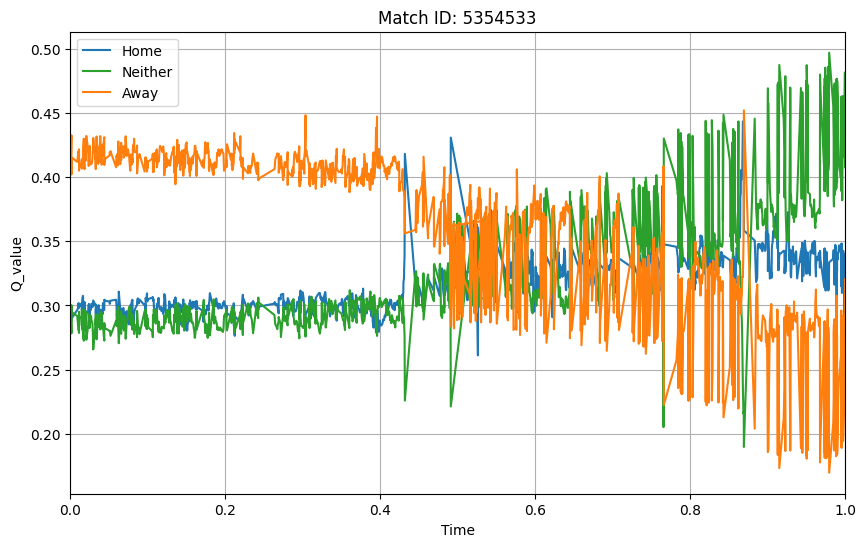

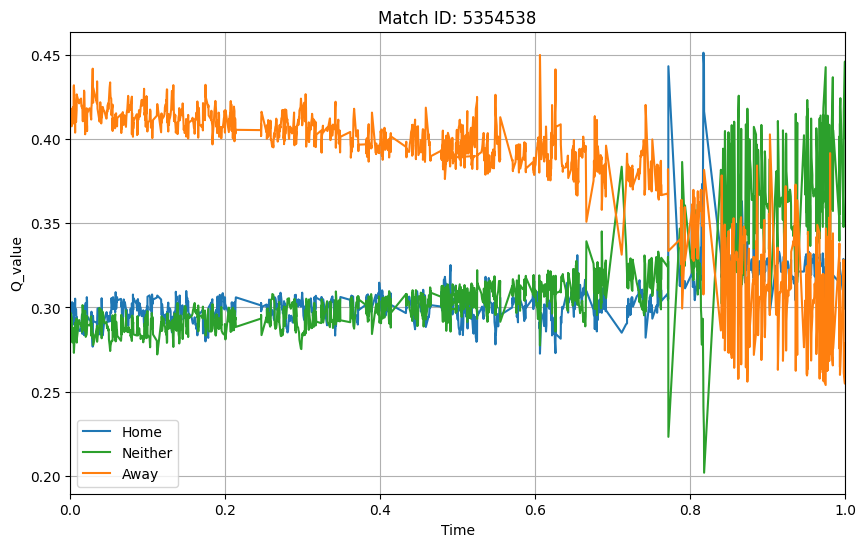

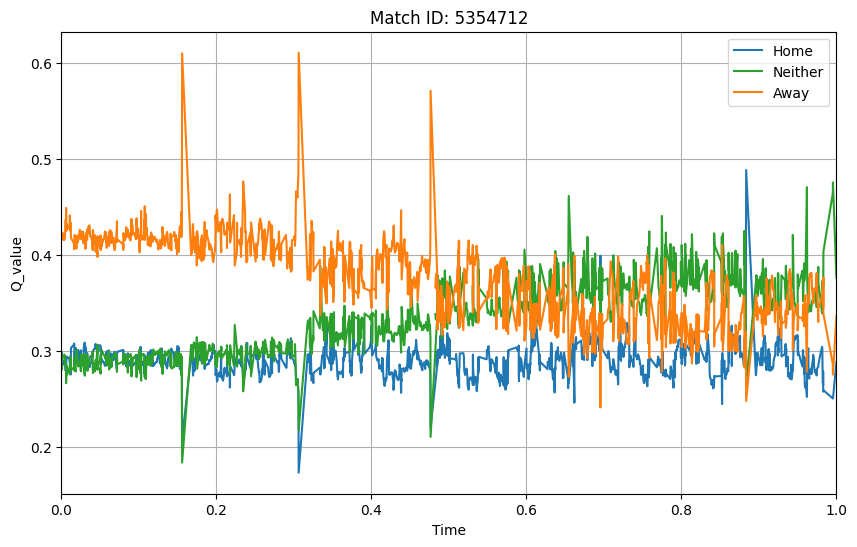

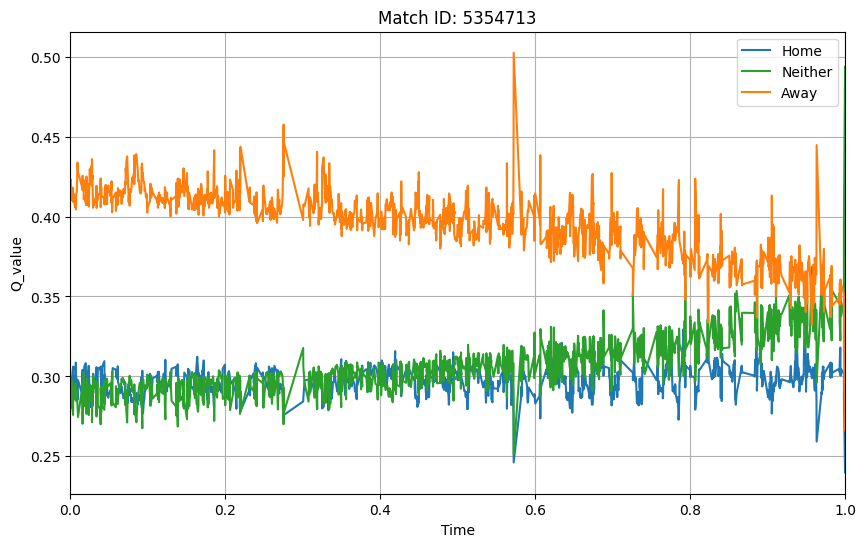

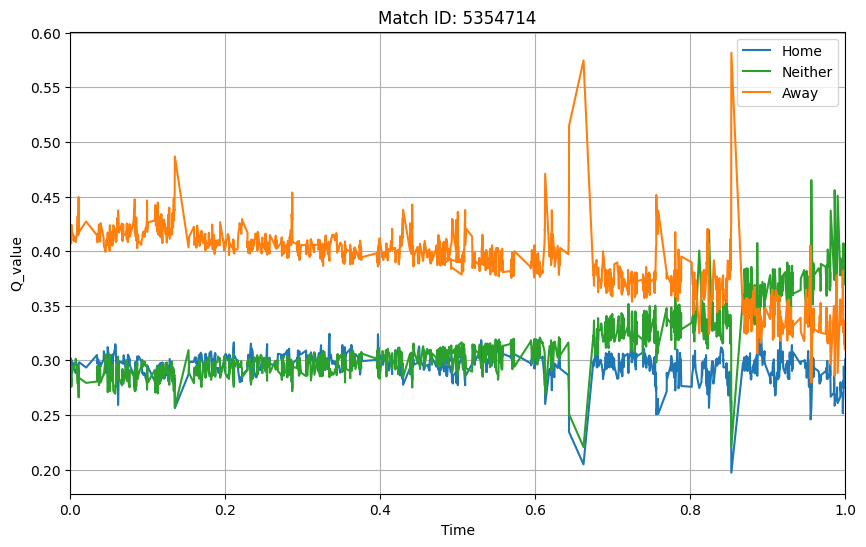

In [55]:
import matplotlib.pyplot as plt

unique_match_ids = event_test['match_id'].unique()
dfs = {match_id: event_test[event_test['match_id'] == match_id] for match_id in unique_match_ids}

for match_id, df in dfs.items():
    plt.figure(figsize=(10, 6))
    plt.plot(df['time'][::1], df['Q_home'], label='Home', color='tab:blue')
    plt.plot(df['time'][::1], df['Q_neither'], label='Neither', color = 'tab:green')
    plt.plot(df['time'][::1], df['Q_away'], label='Away', color = 'tab:orange')
    plt.xlabel('Time')
    plt.ylabel('Q_value')
    #plt.ylim(0, 1)
    plt.xlim(0, 1)
    plt.title(f'Match ID: {match_id}')
    plt.legend()
    plt.grid(True)
    plt.savefig(f'{match_id}_goal_ko.png')
    plt.show()

In [56]:
event_test['Q_diff_home'] = event_test['Q_home'] - event_test['Q_home'].shift(1)
event_test['Q_diff_away'] = event_test['Q_away'] - event_test['Q_away'].shift(1)

event_test.loc[event_test['side'] == 'home', 'Q_diff'] = event_test.loc[event_test['side'] == 'home', 'Q_diff_home']
event_test.loc[event_test['side'] == 'away', 'Q_diff'] = event_test.loc[event_test['side'] == 'away', 'Q_diff_away']

event_test = event_test.drop(['Q_diff_home', 'Q_diff_away'], axis=1)

goal_indices = event_test[event_test['goal'] == 1].index
for index in goal_indices:
    next_index = index + 1
    if next_index < len(event_test):
        event_test.at[next_index, 'Q_diff'] = 0

event_test

,id,match_id,team_id,opponent_team_id,player_id,side,action,outcome,goal,time,duration,location_x,location_y,velocity_x,velocity_y,manpower,Q_home,Q_away,Q_neither,Q_diff
0,1559860911,5354533,1623,1609,28292,away,back_pass,1,0,0.000000,0.000000,50.0,52.0,0.000000,0.000000,0,0.291825,0.415224,0.292951,NaN
1,1559860908,5354533,1623,1609,9433,away,forward_pass,1,0,0.000544,2.309255,35.0,57.0,-6.495601,2.165200,0,0.287623,0.419796,0.292581,0.004572
2,1559860091,5354533,1609,1623,415917,home,aerial_duel,1,0,0.001088,0.000000,26.0,16.0,0.000000,0.000000,0,0.297213,0.416529,0.286258,0.009591
3,1559860925,5354533,1623,1609,540754,away,aerial_duel,0,0,0.001088,0.000000,74.0,84.0,0.000000,0.000000,0,0.292587,0.413381,0.294032,-0.003148
4,1559860926,5354533,1623,1609,8240,away,forward_pass,0,0,0.001450,2.005953,61.0,97.0,-6.480710,6.480710,0,0.287401,0.422042,0.290557,0.008661
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8789,1561528055,5354714,1623,1614,28292,home,pass,1,0,0.999296,0.956569,41.0,71.0,-10.454029,11.499432,0,0.290188,0.336402,0.373410,-0.001184
8790,1561528544,5354714,1614,1623,404216,away,defensive_duel,0,0,0.999296,0.000000,59.0,27.0,0.000000,0.000000,0,0.291695,0.314940,0.393366,-0.021462
8791,1561528671,5354714,1623,1614,0,home,dribble,1,0,0.999296,0.000000,41.0,73.0,0.000000,0.000000,0,0.288073,0.318403,0.393524,-0.003622
8792,1561528057,5354714,1623,1614,447229,home,lateral_pass,1,0,0.999648,1.722104,54.0,67.0,-7.548905,3.484110,0,0.284214,0.310010,0.405776,-0.003859


In [76]:
players = pd.read_csv('players_PL_2023.csv')
players

,player_id,name,position,team_name,total_minutes,goals,assists,shots,orapm,drapm,rapm
0,518165,H. Traoré,Midfielder,Bournemouth,458,0.000000,0.000000,1.179039,2.437824,-3.848390,-1.410566
1,520291,B. Saka,Forward,Arsenal,3468,0.363322,0.233564,2.102076,1.480594,2.915689,4.396283
2,521457,A. Bella-Kotchap,Defender,Southampton,2064,0.000000,0.087209,0.523256,-0.716628,-2.509055,-3.225683
3,522222,K. Schade,Forward,Brentford,815,0.000000,0.110429,1.104294,1.682872,3.044774,4.727645
4,524144,C. Drameh,Defender,Leeds United,73,0.000000,0.000000,0.000000,-0.425108,-0.180567,-0.605675
...,...,...,...,...,...,...,...,...,...,...,...
570,512982,Matheus Cunha,Forward,Wolverhampton Wanderers,1040,0.173077,0.000000,1.817308,-1.677032,-1.811279,-3.488311
571,514375,M. Djénépo,Midfielder,Southampton,781,0.000000,0.230474,0.345711,-1.111933,0.995284,-0.116650
572,514484,Fábio Carvalho,Midfielder,Liverpool,411,0.437956,0.000000,2.408759,3.352454,0.232115,3.584570
573,514487,A. Mighten,Forward,Nottingham Forest,13,0.000000,0.000000,0.000000,-0.125307,-0.418198,-0.543505


In [77]:
gim = pd.merge(event_test, players, on='player_id', how='left')
gim

,id,match_id,team_id,opponent_team_id,player_id,side,action,outcome,goal,time,...,name,position,team_name,total_minutes,goals,assists,shots,orapm,drapm,rapm
0,1559860911,5354533,1623,1609,28292,away,back_pass,1,0,0.000000,...,A. Doucouré,Midfielder,Everton,1725.0,0.260870,0.052174,0.991304,2.499665,2.132146,4.631811
1,1559860908,5354533,1623,1609,9433,away,forward_pass,1,0,0.000544,...,J. Tarkowski,Defender,Everton,3766.0,0.023898,0.023898,0.549655,-2.227833,-2.440704,-4.668536
2,1559860091,5354533,1609,1623,415917,home,aerial_duel,1,0,0.001088,...,Gabriel Magalhaes,Defender,Arsenal,3755.0,0.071904,0.000000,0.599201,3.902670,3.943429,7.846099
3,1559860925,5354533,1623,1609,540754,away,aerial_duel,0,0,0.001088,...,A. Onana,Midfielder,Everton,2705.0,0.033272,0.033272,0.964880,-1.109558,-1.700015,-2.809572
4,1559860926,5354533,1623,1609,8240,away,forward_pass,0,0,0.001450,...,S. Coleman,Defender,Everton,1794.0,0.050167,0.000000,0.250836,1.571377,-1.377304,0.194073
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9253,1561528055,5354714,1623,1614,28292,home,pass,1,0,0.999296,...,A. Doucouré,Midfielder,Everton,1725.0,0.260870,0.052174,0.991304,2.499665,2.132146,4.631811
9254,1561528544,5354714,1614,1623,404216,away,defensive_duel,0,0,0.999296,...,B. Kamara,Midfielder,Aston Villa,1961.0,0.000000,0.045895,0.183580,-2.735593,-3.018452,-5.754045
9255,1561528671,5354714,1623,1614,0,home,dribble,1,0,0.999296,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9256,1561528057,5354714,1623,1614,447229,home,lateral_pass,1,0,0.999648,...,E. Simms,Forward,Everton,282.0,0.319149,0.000000,2.553191,-0.768041,-1.706922,-2.474963


In [78]:
gim.loc[gim['action'].isin(['game_interruption', 'goalkeeper_exit', 'fairplay', 'goal_kick']), 'Q_diff'] = 0
gim.loc[gim['time'] == 0, 'Q_diff'] = 0

gim

,id,match_id,team_id,opponent_team_id,player_id,side,action,outcome,goal,time,...,name,position,team_name,total_minutes,goals,assists,shots,orapm,drapm,rapm
0,1559860911,5354533,1623,1609,28292,away,back_pass,1,0,0.000000,...,A. Doucouré,Midfielder,Everton,1725.0,0.260870,0.052174,0.991304,2.499665,2.132146,4.631811
1,1559860908,5354533,1623,1609,9433,away,forward_pass,1,0,0.000544,...,J. Tarkowski,Defender,Everton,3766.0,0.023898,0.023898,0.549655,-2.227833,-2.440704,-4.668536
2,1559860091,5354533,1609,1623,415917,home,aerial_duel,1,0,0.001088,...,Gabriel Magalhaes,Defender,Arsenal,3755.0,0.071904,0.000000,0.599201,3.902670,3.943429,7.846099
3,1559860925,5354533,1623,1609,540754,away,aerial_duel,0,0,0.001088,...,A. Onana,Midfielder,Everton,2705.0,0.033272,0.033272,0.964880,-1.109558,-1.700015,-2.809572
4,1559860926,5354533,1623,1609,8240,away,forward_pass,0,0,0.001450,...,S. Coleman,Defender,Everton,1794.0,0.050167,0.000000,0.250836,1.571377,-1.377304,0.194073
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9253,1561528055,5354714,1623,1614,28292,home,pass,1,0,0.999296,...,A. Doucouré,Midfielder,Everton,1725.0,0.260870,0.052174,0.991304,2.499665,2.132146,4.631811
9254,1561528544,5354714,1614,1623,404216,away,defensive_duel,0,0,0.999296,...,B. Kamara,Midfielder,Aston Villa,1961.0,0.000000,0.045895,0.183580,-2.735593,-3.018452,-5.754045
9255,1561528671,5354714,1623,1614,0,home,dribble,1,0,0.999296,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9256,1561528057,5354714,1623,1614,447229,home,lateral_pass,1,0,0.999648,...,E. Simms,Forward,Everton,282.0,0.319149,0.000000,2.553191,-0.768041,-1.706922,-2.474963


In [79]:
agg_gim = event_test.groupby('player_id')['Q_diff'].sum().reset_index()
players['GIM'] = players['player_id'].map(agg_gim.set_index('player_id')['Q_diff'])
players = players[pd.notna(players['GIM'])]
players

,player_id,name,position,team_name,total_minutes,goals,assists,shots,orapm,drapm,rapm,GIM
0,518165,H. Traoré,Midfielder,Bournemouth,458,0.000000,0.000000,1.179039,2.437824,-3.848390,-1.410566,0.198937
1,520291,B. Saka,Forward,Arsenal,3468,0.363322,0.233564,2.102076,1.480594,2.915689,4.396283,-0.108598
15,532892,T. Mitchell,Defender,Crystal Palace,3142,0.000000,0.057288,0.143221,-3.676791,2.853679,-0.823112,0.141206
16,532949,D. McNeil,Midfielder,Everton,2749,0.229174,0.098218,1.342306,1.743775,-4.653803,-2.910028,-1.059185
21,536060,Fábio Vieira,Midfielder,Arsenal,619,0.145396,0.290792,1.744750,1.621375,1.680249,3.301625,-0.086806
...,...,...,...,...,...,...,...,...,...,...,...,...
541,475041,A. Sambi Lokonga,Midfielder,Arsenal,803,0.000000,0.000000,0.224159,-1.239747,3.088754,1.849007,0.194254
542,475041,A. Sambi Lokonga,Midfielder,Arsenal,803,0.000000,0.000000,0.224159,-1.239747,3.088754,1.849007,0.194254
555,487034,E. Eze,Midfielder,Crystal Palace,2857,0.315016,0.126006,2.142107,-1.520773,5.799958,4.279185,0.007262
557,487581,C. Mepham,Defender,Bournemouth,2415,0.000000,0.000000,0.186335,-4.169223,-4.662466,-8.831689,0.014872


In [80]:
players['GIM'] = (players['GIM'] / players['total_minutes']) * 90
players = players.sort_values(by='GIM', ascending=False)
players.reset_index(drop=True, inplace=True)
players

/var/folders/s3/5btmtsk10p325dsj9f5myq1r0000gq/T/ipykernel_25074/3163111590.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  players['GIM'] = (players['GIM'] / players['total_minutes']) * 90


,player_id,name,position,team_name,total_minutes,goals,assists,shots,orapm,drapm,rapm,GIM
0,808262,M. Perrone,Midfielder,Manchester City,22,0.000000,0.000000,0.000000,-0.021852,-0.146702,-0.168554,0.351449
1,359934,K. Phillips,Midfielder,Manchester City,345,0.000000,0.000000,1.304348,-1.320391,-1.756845,-3.077235,0.107196
2,658798,R. Lewis,Defender,Manchester City,968,0.000000,0.000000,0.464876,2.062174,1.166745,3.228919,0.061368
3,472696,Sergio Gómez,Defender,Manchester City,388,0.000000,0.231959,1.623711,-0.095868,-1.206248,-1.302116,0.045992
4,550459,J. Álvarez,Forward,Manchester City,1608,0.503731,0.000000,2.574627,0.037396,0.724202,0.761598,0.041922
...,...,...,...,...,...,...,...,...,...,...,...,...
125,565016,R. Aït-Nouri,Defender,Wolverhampton Wanderers,1193,0.075440,0.000000,0.678961,-1.549754,-1.239835,-2.789589,-0.041340
126,7919,M. Keane,Defender,Everton,1099,0.081893,0.163785,1.064604,0.305005,-4.588409,-4.283404,-0.092836
127,12379,B. Godfrey,Defender,Everton,884,0.000000,0.101810,0.509050,-1.384564,-1.823177,-3.207742,-0.096458
128,353236,T. Davies,Midfielder,Everton,635,0.000000,0.000000,1.133858,-2.995791,-1.498628,-4.494419,-0.098407


In [81]:
players[0 : 30]

,player_id,name,position,team_name,total_minutes,goals,assists,shots,orapm,drapm,rapm,GIM
0,808262,M. Perrone,Midfielder,Manchester City,22,0.000000,0.000000,0.000000,-0.021852,-0.146702,-0.168554,0.351449
1,359934,K. Phillips,Midfielder,Manchester City,345,0.000000,0.000000,1.304348,-1.320391,-1.756845,-3.077235,0.107196
2,658798,R. Lewis,Defender,Manchester City,968,0.000000,0.000000,0.464876,2.062174,1.166745,3.228919,0.061368
3,472696,Sergio Gómez,Defender,Manchester City,388,0.000000,0.231959,1.623711,-0.095868,-1.206248,-1.302116,0.045992
4,550459,J. Álvarez,Forward,Manchester City,1608,0.503731,0.000000,2.574627,0.037396,0.724202,0.761598,0.041922
5,518165,H. Traoré,Midfielder,Bournemouth,458,0.000000,0.000000,1.179039,2.437824,-3.848390,-1.410566,0.039092
6,344181,K. Tsimikas,Defender,Liverpool,868,0.000000,0.414747,0.622120,-0.113678,-1.566545,-1.680223,0.027842
7,593014,J. Zemura,Defender,Bournemouth,1592,0.000000,0.056533,0.169598,-3.799584,-3.776052,-7.575636,0.026820
8,447205,P. Foden,Midfielder,Manchester City,2022,0.489614,0.178042,1.913947,3.640890,3.166045,6.806936,0.026022
9,475041,A. Sambi Lokonga,Midfielder,Arsenal,803,0.000000,0.000000,0.224159,-1.239747,3.088754,1.849007,0.021772


In [82]:
gim_Haaland = gim[gim['name'] == 'E. Haaland']
gim_Haaland

,id,match_id,team_id,opponent_team_id,player_id,side,action,outcome,goal,time,...,name,position,team_name,total_minutes,goals,assists,shots,orapm,drapm,rapm
3705,1559246263,5354712,1625,1659,427097,away,pass,1,0,0.004822,...,E. Haaland,Forward,Manchester City,2996.0,1.081442,0.24032,3.394526,8.133682,5.10715,13.240832
3832,1559246457,5354712,1625,1659,427097,away,loss,0,0,0.061440,...,E. Haaland,Forward,Manchester City,2996.0,1.081442,0.24032,3.394526,8.133682,5.10715,13.240832
3853,1559246475,5354712,1625,1659,427097,away,lateral_pass,1,0,0.069655,...,E. Haaland,Forward,Manchester City,2996.0,1.081442,0.24032,3.394526,8.133682,5.10715,13.240832
3873,1559246505,5354712,1625,1659,427097,away,carry,0,0,0.083944,...,E. Haaland,Forward,Manchester City,2996.0,1.081442,0.24032,3.394526,8.133682,5.10715,13.240832
3874,1559246506,5354712,1625,1659,427097,away,lateral_pass,0,0,0.084301,...,E. Haaland,Forward,Manchester City,2996.0,1.081442,0.24032,3.394526,8.133682,5.10715,13.240832
3988,1559246649,5354712,1625,1659,427097,away,back_pass,0,0,0.128594,...,E. Haaland,Forward,Manchester City,2996.0,1.081442,0.24032,3.394526,8.133682,5.10715,13.240832
4026,1559246686,5354712,1625,1659,427097,away,touch,0,0,0.147526,...,E. Haaland,Forward,Manchester City,2996.0,1.081442,0.24032,3.394526,8.133682,5.10715,13.240832
4057,1559248561,5354712,1625,1659,427097,away,opportunity,0,0,0.155206,...,E. Haaland,Forward,Manchester City,2996.0,1.081442,0.24032,3.394526,8.133682,5.10715,13.240832
4072,1559246752,5354712,1625,1659,427097,away,pass,1,0,0.171816,...,E. Haaland,Forward,Manchester City,2996.0,1.081442,0.24032,3.394526,8.133682,5.10715,13.240832
4128,1559246808,5354712,1625,1659,427097,away,lateral_pass,1,0,0.200393,...,E. Haaland,Forward,Manchester City,2996.0,1.081442,0.24032,3.394526,8.133682,5.10715,13.240832


In [83]:
gim_Haaland = gim_Haaland.sort_values(by='Q_diff', ascending=False)
gim_Haaland

,id,match_id,team_id,opponent_team_id,player_id,side,action,outcome,goal,time,...,name,position,team_name,total_minutes,goals,assists,shots,orapm,drapm,rapm
4327,1559248535,5354712,1625,1659,427097,away,shot,1,1,0.306126,...,E. Haaland,Forward,Manchester City,2996.0,1.081442,0.24032,3.394526,8.133682,5.10715,13.240832
5203,1559248019,5354712,1625,1659,427097,away,defensive_duel,0,0,0.758528,...,E. Haaland,Forward,Manchester City,2996.0,1.081442,0.24032,3.394526,8.133682,5.10715,13.240832
4471,1559247208,5354712,1625,1659,427097,away,aerial_duel,0,0,0.400607,...,E. Haaland,Forward,Manchester City,2996.0,1.081442,0.24032,3.394526,8.133682,5.10715,13.240832
4680,1559247423,5354712,1625,1659,427097,away,aerial_duel,1,0,0.498482,...,E. Haaland,Forward,Manchester City,2996.0,1.081442,0.24032,3.394526,8.133682,5.10715,13.240832
4499,1559247235,5354712,1625,1659,427097,away,aerial_duel,0,0,0.414360,...,E. Haaland,Forward,Manchester City,2996.0,1.081442,0.24032,3.394526,8.133682,5.10715,13.240832
4882,1559247721,5354712,1625,1659,427097,away,ground_duel,0,0,0.604929,...,E. Haaland,Forward,Manchester City,2996.0,1.081442,0.24032,3.394526,8.133682,5.10715,13.240832
4128,1559246808,5354712,1625,1659,427097,away,lateral_pass,1,0,0.200393,...,E. Haaland,Forward,Manchester City,2996.0,1.081442,0.24032,3.394526,8.133682,5.10715,13.240832
5204,1559248020,5354712,1625,1659,427097,away,foul,0,0,0.759064,...,E. Haaland,Forward,Manchester City,2996.0,1.081442,0.24032,3.394526,8.133682,5.10715,13.240832
5062,1559247866,5354712,1625,1659,427097,away,shot_block,0,0,0.696017,...,E. Haaland,Forward,Manchester City,2996.0,1.081442,0.24032,3.394526,8.133682,5.10715,13.240832
5069,1559247872,5354712,1625,1659,427097,away,aerial_duel,0,0,0.697625,...,E. Haaland,Forward,Manchester City,2996.0,1.081442,0.24032,3.394526,8.133682,5.10715,13.240832
